In [1]:
!pip3 install torch torchvision torchaudio --index-url https://download.pytorch.org/whl/cu117

Looking in indexes: https://download.pytorch.org/whl/cu117


In [2]:
# %matplotlib inline
import torch
import torch.nn as nn
import torchvision.models as models
import numpy as np
import matplotlib.pyplot as plt
import PIL
from torchsummary import summary
from collections import OrderedDict
import torchvision.transforms as transforms



In [3]:
alexnet = models.alexnet(pretrained =True)
print(alexnet)

c:\Users\sumon\miniconda3\envs\smai\lib\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
c:\Users\sumon\miniconda3\envs\smai\lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=AlexNet_Weights.IMAGENET1K_V1`. You can also use `weights=AlexNet_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


AlexNet(
  (features): Sequential(
    (0): Conv2d(3, 64, kernel_size=(11, 11), stride=(4, 4), padding=(2, 2))
    (1): ReLU(inplace=True)
    (2): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=False)
    (3): Conv2d(64, 192, kernel_size=(5, 5), stride=(1, 1), padding=(2, 2))
    (4): ReLU(inplace=True)
    (5): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=False)
    (6): Conv2d(192, 384, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (7): ReLU(inplace=True)
    (8): Conv2d(384, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (9): ReLU(inplace=True)
    (10): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (11): ReLU(inplace=True)
    (12): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=False)
  )
  (avgpool): AdaptiveAvgPool2d(output_size=(6, 6))
  (classifier): Sequential(
    (0): Dropout(p=0.5, inplace=False)
    (1): Linear(in_features=9216, out_features=4096, bias=True)
 

In [4]:
from torch import nn
class AlexnetDeconv(nn.Module):
    
    def __init__(self):
        super(AlexnetDeconv, self).__init__()
        

        self.features = nn.Sequential(
            nn.Conv2d(3, 64, kernel_size=11, stride=4, padding=2),
            nn.ReLU(inplace=True),
            nn.MaxPool2d(kernel_size=3, stride=2, padding=0, return_indices=True),
            nn.Conv2d(64, 192, kernel_size=5, stride=1, padding=2),
            nn.ReLU(inplace=True),
            nn.MaxPool2d(kernel_size=3, stride=2, padding=0, return_indices=True),
            nn.Conv2d(192, 384, kernel_size=3, stride=1, padding=1),
            nn.ReLU(inplace=True),
            nn.Conv2d(384, 256, kernel_size=3, stride=1, padding=1),
            nn.ReLU(inplace=True),
            nn.Conv2d(256, 256, kernel_size=3, stride=1, padding=1),
            nn.ReLU(inplace=True),
            nn.MaxPool2d(kernel_size=3, stride=2, padding=0, return_indices=True)
        )
        self.avgpool = nn.AdaptiveAvgPool2d(output_size=(6, 6))
        self.classifier = nn.Sequential(
            nn.Dropout(p=0.5, inplace=False),
            nn.Linear(in_features=9216, out_features=4096, bias=True),
            nn.ReLU(inplace=True),
            nn.Dropout(p=0.5, inplace=False),
            nn.Linear(in_features=4096, out_features=4096, bias=True),
            nn.ReLU(inplace=True),
            nn.Linear(in_features=4096, out_features=1000, bias=True)
        )
        self.deconv = nn.Sequential(
            nn.MaxUnpool2d(kernel_size=3, stride=2, padding=0),
            nn.ReLU(inplace=True),
            nn.ConvTranspose2d(256, 256, kernel_size=3, stride=1, padding=1, bias=False),
            nn.ReLU(inplace=True),
            nn.ConvTranspose2d(256, 384, kernel_size=3, stride=1, padding=1, bias=False),
            nn.ReLU(inplace=True),
            nn.ConvTranspose2d(384, 192, kernel_size=3, stride=1, padding=1, bias=False),
            nn.MaxUnpool2d(kernel_size=3, stride=2, padding=0),
            nn.ReLU(inplace=True),
            nn.ConvTranspose2d(192, 64, kernel_size=5, stride=1, padding=2, bias=False),
            nn.MaxUnpool2d(kernel_size=3, stride=2, padding=0),
            nn.ReLU(inplace=True),
            nn.ConvTranspose2d(64, 3, kernel_size=11, stride=4, padding=2, bias=False),
        )
        
        self.outputs = [0]*len(self.features)
        self.indices = dict()
        self.sizes = dict()

    def forward(self, x):
        for i, layer in enumerate(self.features):
            if isinstance(layer, nn.MaxPool2d):
                x, indices = layer(x)
                self.outputs[i] = x
                self.indices[i] = indices
            else:
                x = layer(x)
                self.outputs[i] = x
        x = self.avgpool(x)
        x = x.view(x.size(0), -1)
        x = self.classifier(x)
        return x
    
    def deconv_forward(self, x, layer):

        if layer<1 or layer >5:
            return False

        if layer == 5:
            # x = self.deconv[0](x, self.indices[12], output_size=self.outputs[-2].shape[-2:])
            x = self.deconv[1](x)
            x = self.deconv[2](x)
            layer-=1
      
        if layer == 4:
            x = self.deconv[3](x)
            x = self.deconv[4](x)
            layer-=1
        
        if layer == 3:
            x = self.deconv[5](x)
            x = self.deconv[6](x)
            layer-=1
        
        if layer == 2:
            x = self.deconv[7](x, self.indices[5], output_size=self.outputs[4].shape[-2:])
            x = self.deconv[8](x)
            x = self.deconv[9](x)
            layer-=1
     
        if layer == 1:
            x = self.deconv[10](x, self.indices[2], output_size=self.outputs[1].shape[-2:])
            x = self.deconv[11](x)
            x = self.deconv[12](x)

        return x
        


In [5]:
model = AlexnetDeconv()
print(model.state_dict().keys())

odict_keys(['features.0.weight', 'features.0.bias', 'features.3.weight', 'features.3.bias', 'features.6.weight', 'features.6.bias', 'features.8.weight', 'features.8.bias', 'features.10.weight', 'features.10.bias', 'classifier.1.weight', 'classifier.1.bias', 'classifier.4.weight', 'classifier.4.bias', 'classifier.6.weight', 'classifier.6.bias', 'deconv.2.weight', 'deconv.4.weight', 'deconv.6.weight', 'deconv.9.weight', 'deconv.12.weight'])


In [6]:
alexnet_weights = alexnet.state_dict()
print(alexnet_weights.keys())

odict_keys(['features.0.weight', 'features.0.bias', 'features.3.weight', 'features.3.bias', 'features.6.weight', 'features.6.bias', 'features.8.weight', 'features.8.bias', 'features.10.weight', 'features.10.bias', 'classifier.1.weight', 'classifier.1.bias', 'classifier.4.weight', 'classifier.4.bias', 'classifier.6.weight', 'classifier.6.bias'])


In [7]:
new_dict = dict()
for key in alexnet_weights.keys():
    if key in model.state_dict().keys():
        new_dict[key] = alexnet_weights[key]
new_dict['deconv.2.weight'] = alexnet_weights['features.10.weight']
new_dict['deconv.4.weight'] = alexnet_weights['features.8.weight']
new_dict['deconv.6.weight'] = alexnet_weights['features.6.weight']
new_dict['deconv.9.weight'] = alexnet_weights['features.3.weight']
new_dict['deconv.12.weight'] = alexnet_weights['features.0.weight']
model_dict = model.state_dict()
model_dict.update(new_dict)
model.load_state_dict(model_dict)


<All keys matched successfully>

In [8]:
from PIL import Image

def image_preprocess(image_path=None):
    image = Image.open(image_path)
    normalize = transforms.Compose([
        transforms.Resize(256),
        transforms.CenterCrop(224),
        transforms.ToTensor(),
        transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
    ])
    image = normalize(image).unsqueeze(0)
    return image

In [9]:
def find_high_fmap(inp):
    n, m = inp.shape[1:3]
    mxms = []
    for mat in inp[0]:
        mxm = torch.max(mat)
        mxms.append(mxm.detach())
    ind = np.argmax(mxms)
    x = inp.detach().clone()
    zero_mat = torch.tensor([[0]*m]*m)
    for i in range(0, n):
        if i != ind:
            x[0][i]=zero_mat
    x = x.detach().clone()
    return x

In [10]:
def adjust(inp):
    if torch.is_tensor(inp):
        inp=inp.numpy()
    inp = (inp-np.min(inp))/(np.max(inp)-np.min(inp))
    inp*=255
    inp= inp.astype(int)
    return inp

In [11]:
images = []
for i in range(1, 46):
    images.append(image_preprocess(f"images/{i}.jpeg"))

In [12]:
captured_indices = [2, 5, 7, 9, 11]
model.eval()
vizz = []

for i, image in enumerate(images):
    with torch.no_grad():
        output = model(image)
        
    masked = find_high_fmap(model.outputs[captured_indices[i//9]])
    res = model.deconv_forward(masked, (i//9)+1).detach().numpy()
    res = np.transpose(res[0], (1, 2, 0))
    res = adjust(res)
    vizz.append(res) 

In [13]:
def plot_grid(org, viz):
    
    image1 = np.vstack((
            np.hstack((viz[0], viz[1], viz[2])), 
            np.hstack((viz[3], viz[4], viz[5])),
            np.hstack((viz[6], viz[7], viz[8]))
        ))
    image2 = np.vstack((
            np.hstack((org[0], org[1], org[2])), 
            np.hstack((org[3], org[4], org[5])),
            np.hstack((org[6], org[7], org[8]))
        ))
    plt.figure(figsize=(10, 10))
    plt.imshow(image2)
    plt.axis('off')
    plt.show()
    plt.figure(figsize=(10, 10))
    plt.imshow(image1)
    plt.axis('off')
    plt.show()

For Layer 1


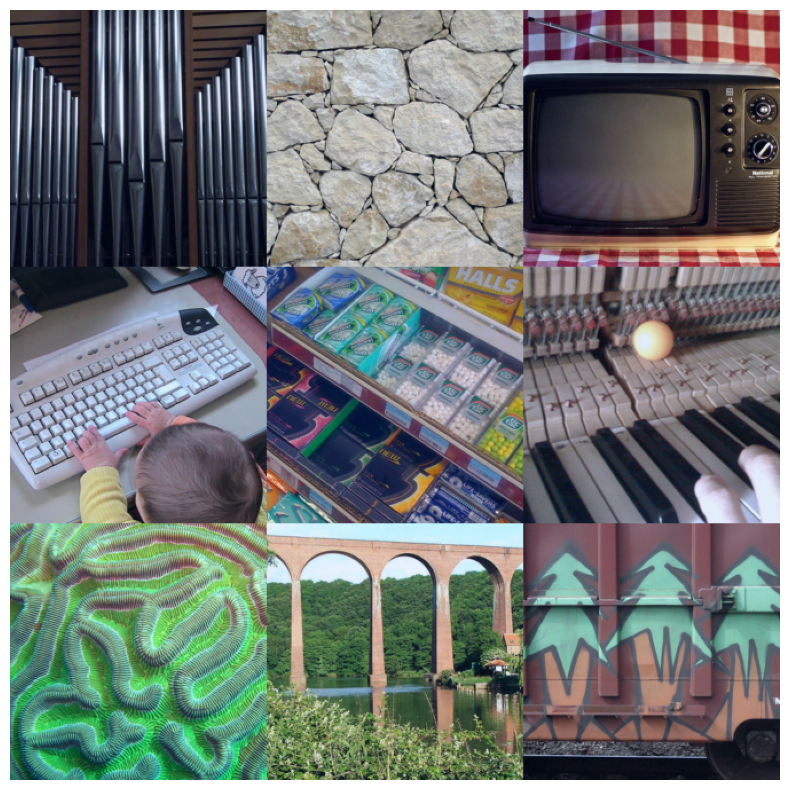

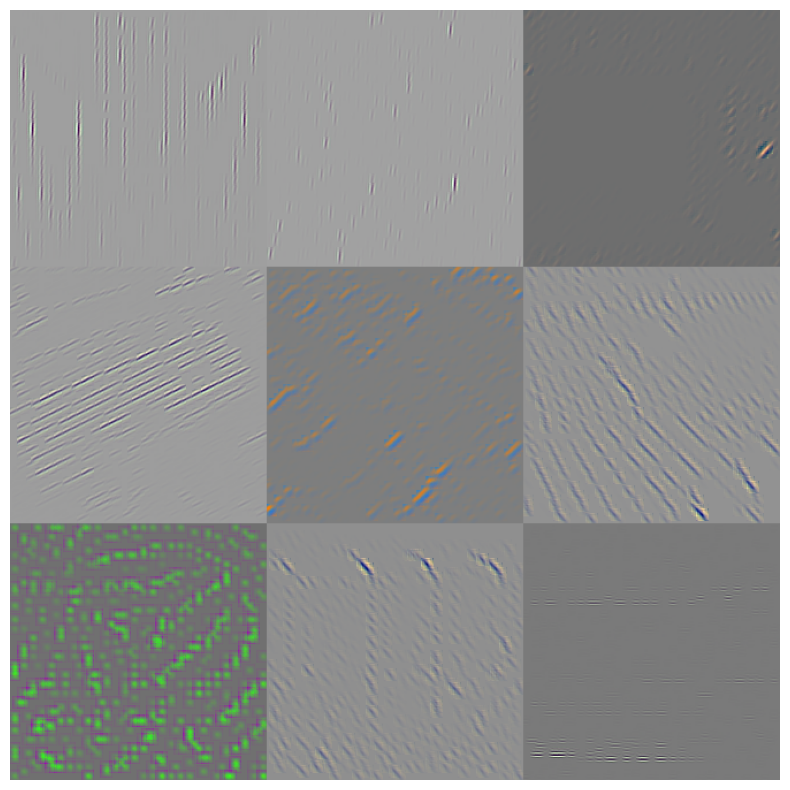

For Layer 2


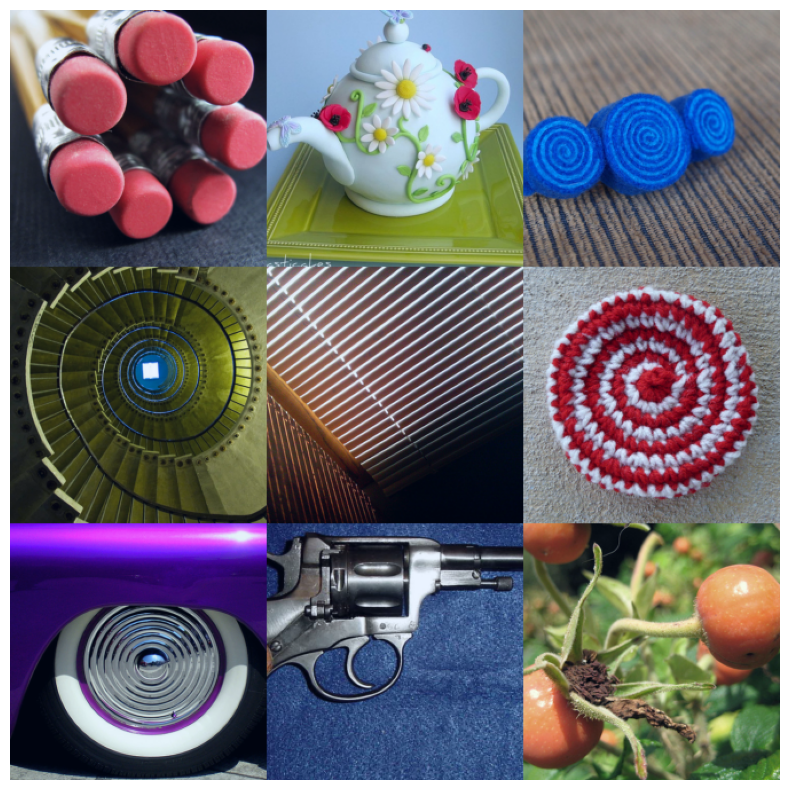

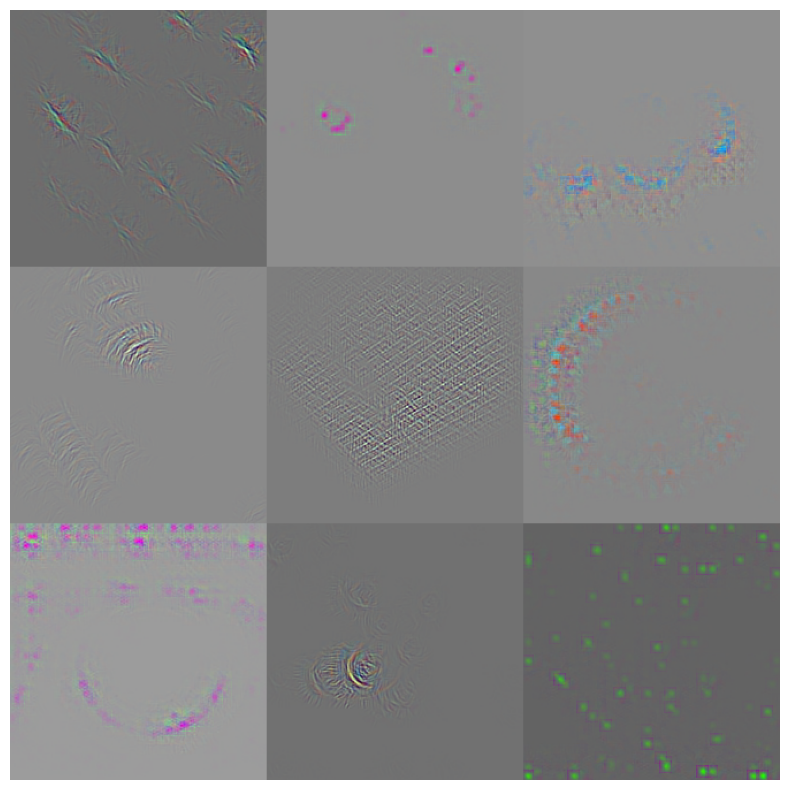

For Layer 3


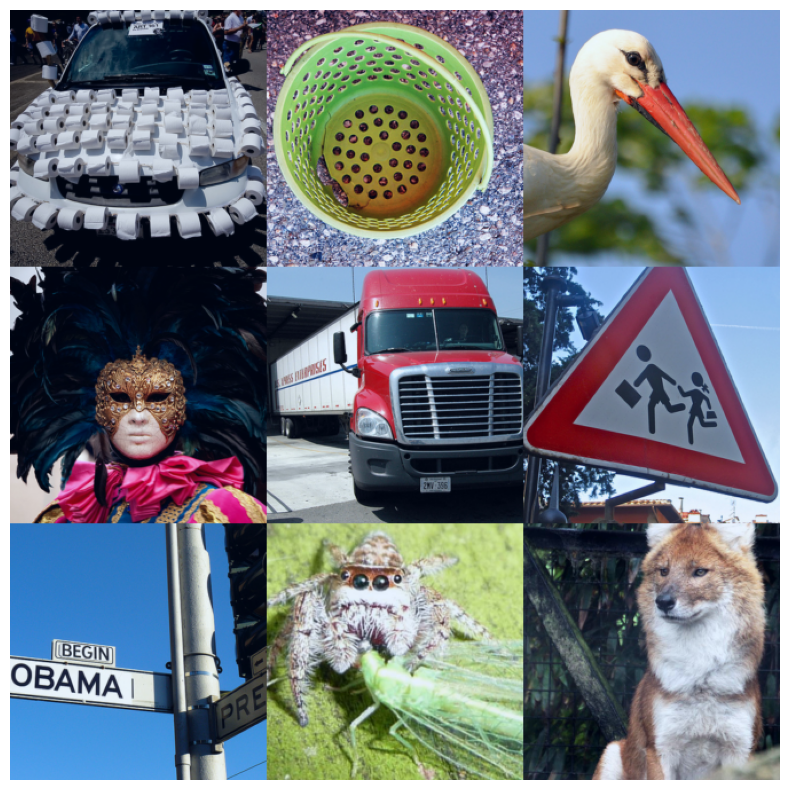

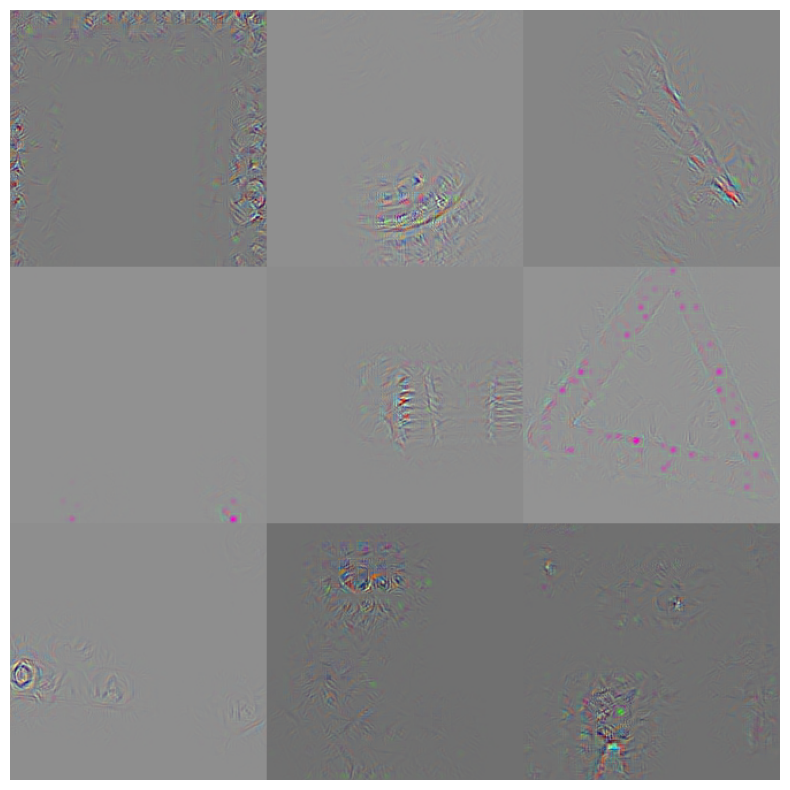

For Layer 4


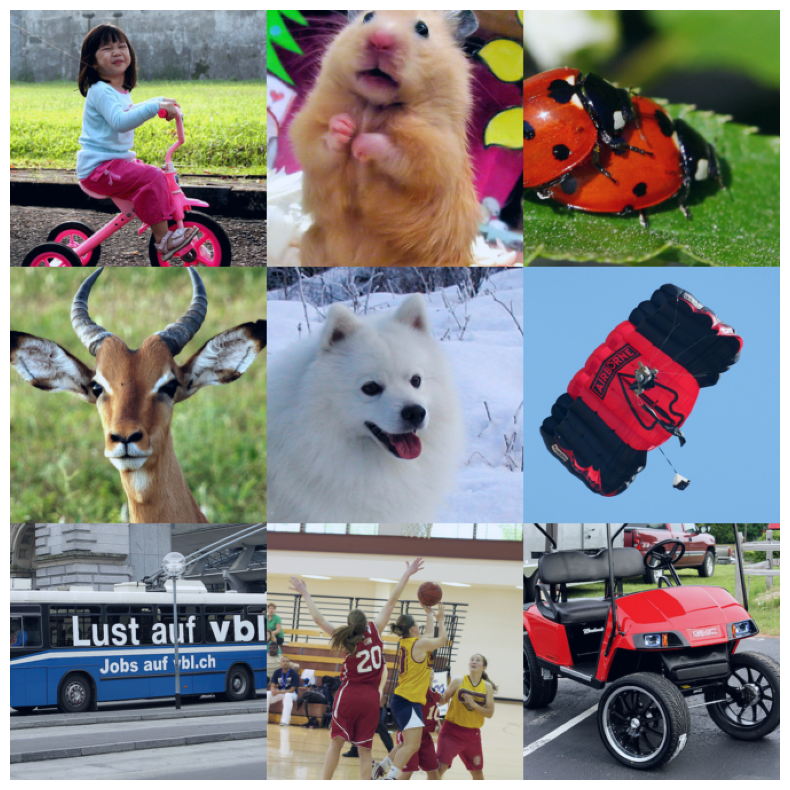

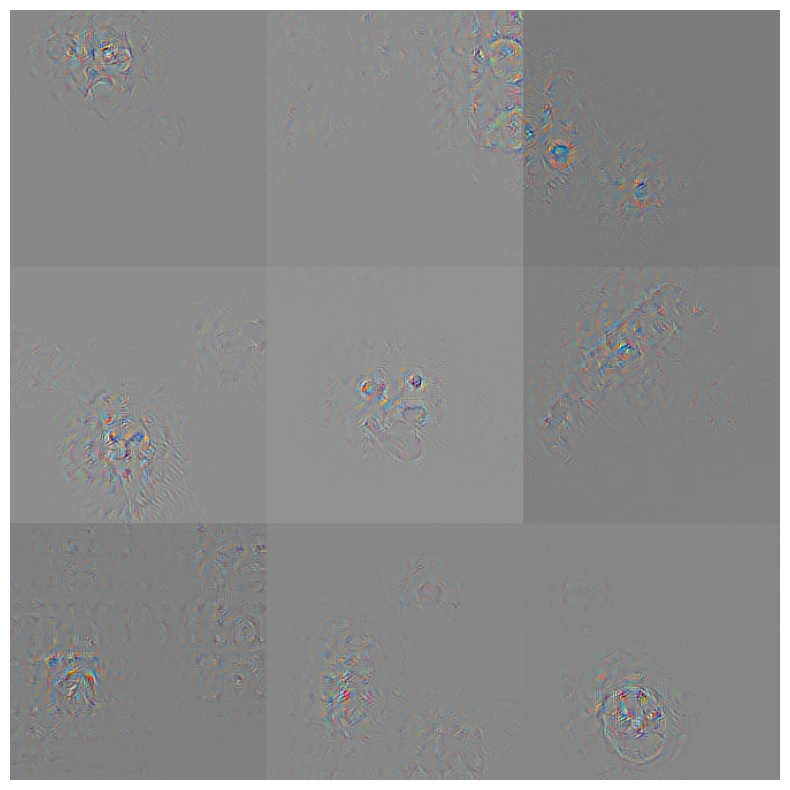

For Layer 5


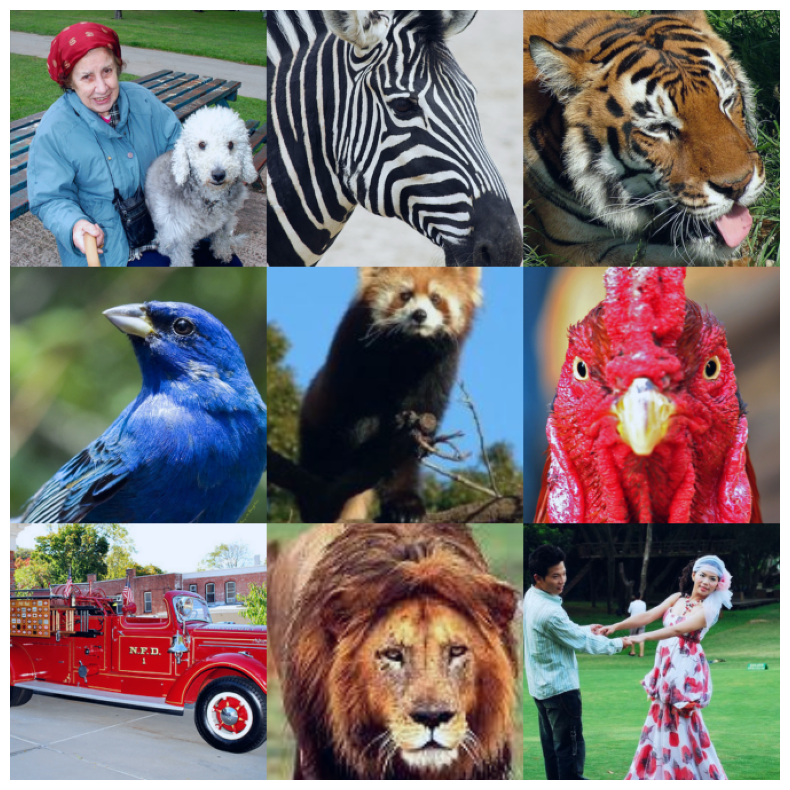

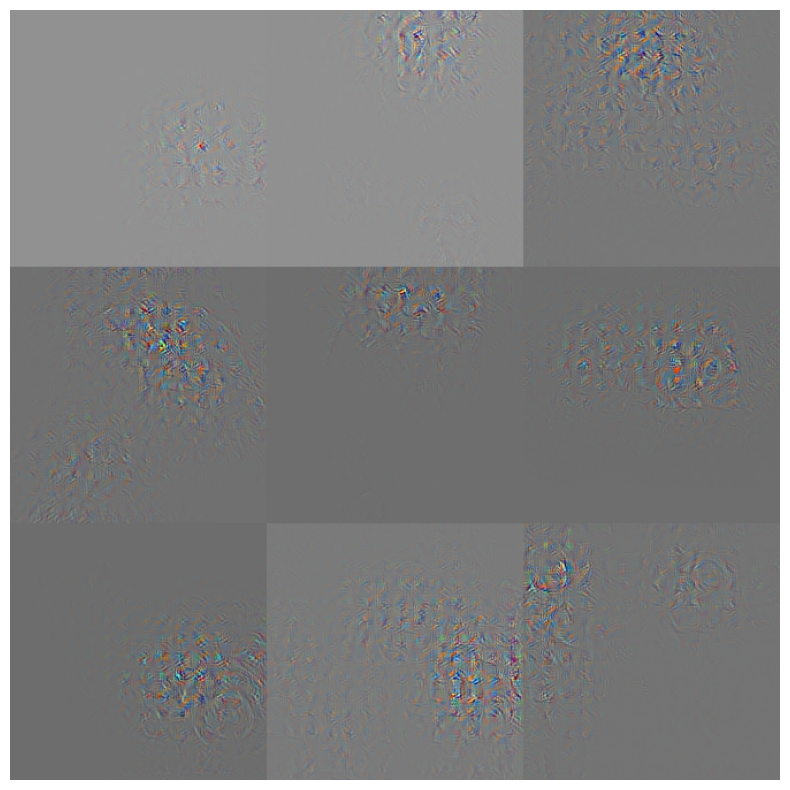

In [14]:
images = [adjust(np.transpose(img[0], (1, 2, 0))) for img in images]

for i in range(1, 6):
    print(f"For Layer {i}")
    plot_grid(images[(i-1)*9:i*9], vizz[(i-1)*9:i*9])